In [ ]:
#connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#clone yolov5
!git clone http://github.com/ultralytics/yolov5

In [ ]:
%cd yolov5

In [ ]:
#install the requirements
!pip install -r requirements.txt

In [ ]:
#importting needed libraries
from IPython.display import Image,Video
import os
import shutil
from random import choice

Part 1: using pre-trained YOLO

In [ ]:
# object detection using pre-trained yolov5m
!python detect.py --weights yolov5m.pt --source test_img.jpg

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
detect: weights=['yolov5m.pt'], source=/content/drive/MyDrive/data/tutrial_tensorflow/yolo/test_img1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CPU

100% 40.8M/40.8M [00:00<00:00, 173MB/s]

Fusing layers... 
YOLOv5m summary: 290 layers, 211

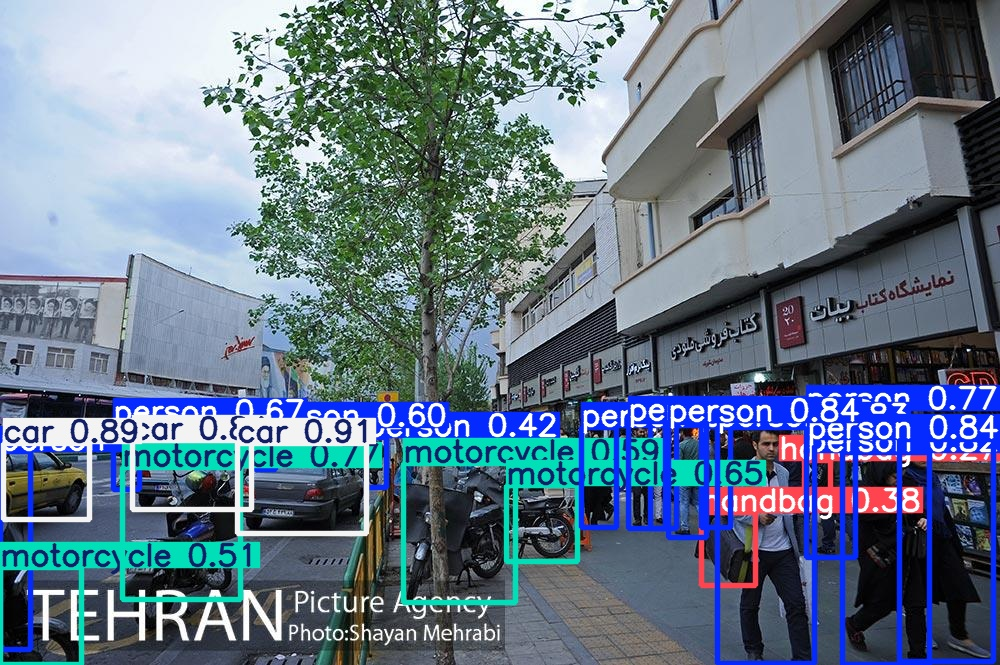

In [ ]:
# showing the result
Image("runs/detect/exp/test_img.jpg")

In [ ]:
# detection of objects with confident rate higher than 80%
!python detect.py --weights yolov5m.pt --conf-thres 0.8 --source /test_img.jpg

detect: weights=['yolov5m.pt'], source=/content/drive/MyDrive/data/tutrial_tensorflow/yolo/test_img1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.8, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CPU

Fusing layers... 
YOLOv5m summary: 290 layers, 21172173 parameters, 0 gradients, 48.9 GFLOPs
image 1/1 /content/drive/MyDrive/data/tutrial_tensorflow/yolo/test_img1.jpg: 448x640 4 persons, 3 cars, 1354.6ms
Speed: 13.2ms pre-process, 1354.6ms inference, 3.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


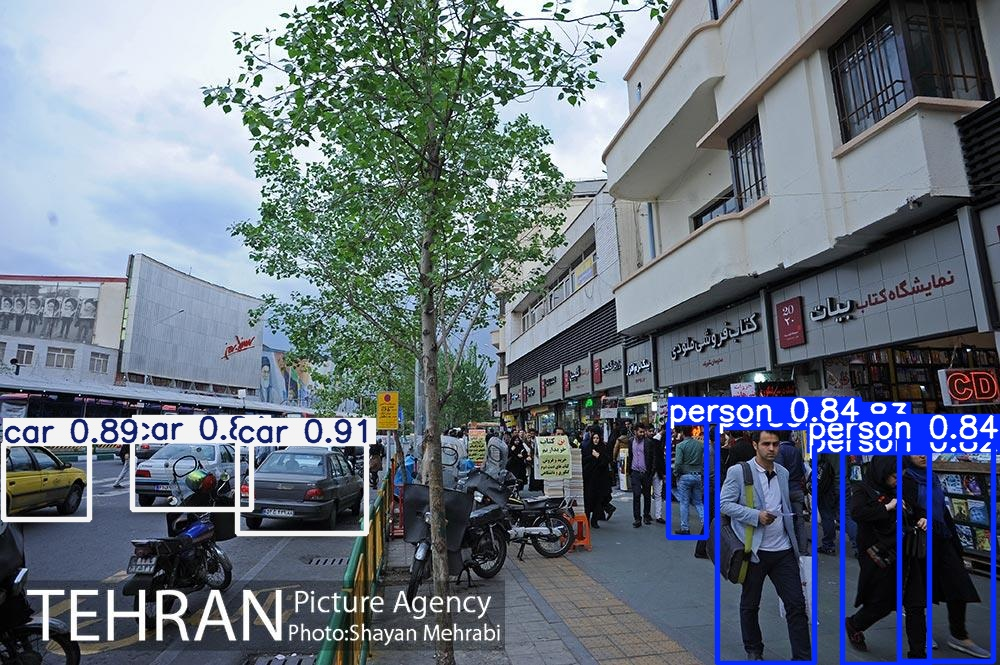

In [ ]:
#showing result
Image("runs/detect/exp2/test_img.jpg")

In [ ]:
# detection of objects in classes 2 & 3 (cara & motorcycle) with confident rate higher than 50%
!python detect.py --weights yolov5m.pt --conf-thres 0.5 --source /test_img.jpg --classes 2 3

detect: weights=['yolov5m.pt'], source=/content/drive/MyDrive/data/tutrial_tensorflow/yolo/test_img1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=[2, 3], agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CPU

Fusing layers... 
YOLOv5m summary: 290 layers, 21172173 parameters, 0 gradients, 48.9 GFLOPs
image 1/1 /content/drive/MyDrive/data/tutrial_tensorflow/yolo/test_img1.jpg: 448x640 3 cars, 4 motorcycles, 1169.7ms
Speed: 6.6ms pre-process, 1169.7ms inference, 14.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


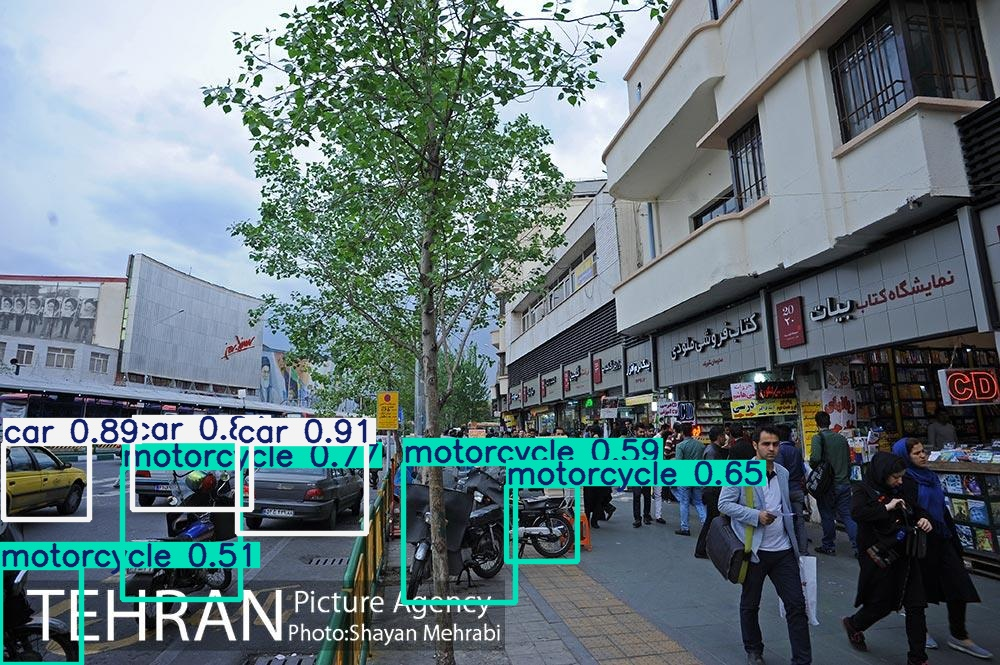

In [ ]:
# showing the result
Image("runs/detect/exp3/test_img.jpg")

Part 2: training YOLO using a new dataset

In [ ]:
# creatng images and labels as lists
imgs=[]
xmls=[]

source_path='/content/drive/MyDrive/data/tutrial_tensorflow/yolo/all'

#80% of dataset = training and 20% of dataset=validation
train_ratio=0.8
val_ratio=0.2

total_imgs_count=len(os.listdir(source_path))/2

for (dir_name,dirs,files) in os.walk(source_path):
  for filename in files:
    if filename.endswith('.txt'):
      xmls.append(filename)
    else:
      imgs.append(filename)

count_train=int(len(imgs)*train_ratio)
count_valid=int(len(imgs)*val_ratio)
print('training numbers:',count_train)
print('valid numbers:',count_valid)

training numbers: 3468
valid numbers: 867


In [ ]:
#creating train and validation folders
train_img_path='/content/yolov5/data/images/train'
train_lbl_path='/content/yolov5/data/labels/train'
val_img_path='/content/yolov5/data/images/valid'
val_lbl_path='/content/yolov5/data/labels/valid'

if not os.path.exists(train_img_path):
  os.mkdir(train_img_path)
if not os.path.exists(train_lbl_path):
  os.mkdir(train_lbl_path)
if not os.path.exists(val_img_path):
  os.mkdir(val_img_path)
if not os.path.exists(val_lbl_path):
  os.mkdir(val_lbl_path)

In [ ]:
# transfering images and labels to train and validation folders
imgs2=imgs.copy()
xmls2=xmls.copy()
for i in range(count_train):
  filejpg=choice(imgs)
  filexml=filejpg[:-4]+'.txt'
  shutil.copy(os.path.join(source_path,filejpg),os.path.join(train_img_path,filejpg))
  shutil.copy(os.path.join(source_path,filexml),os.path.join(train_lbl_path,filexml))
  imgs.remove(filejpg)
  xmls.remove(filexml)
  print('train:_img',len(os.listdir(train_img_path)))
  print('train_lbl:',len(os.listdir(train_lbl_path)))

for j in range(count_valid):
  filejpg=choice(imgs2)
  filexml=filejpg[:-4]+'.txt'
  shutil.copy(os.path.join(source_path,filejpg),os.path.join(val_img_path,filejpg))
  shutil.copy(os.path.join(source_path,filexml),os.path.join(val_lbl_path,filexml))
  imgs2.remove(filejpg)
  xmls2.remove(filexml)
  print('valid:_img',len(os.listdir(val_img_path)))
  print('valid_lbl:',len(os.listdir(val_lbl_path)))

In [ ]:
len(os.listdir(val_img_path))

867

In [ ]:
#define dataset.yaml in 'data' folder
shutil.copy('/content/drive/MyDrive/data/tutrial_tensorflow/yolo/dataset.yaml','/dataset.yaml')

'/content/yolov5/data/dataset.yaml'

In [ ]:
#train yolov5 on our dataset
!python train.py --img 415 --batch 16 --epochs 20 --data dataset.yaml --weights yolov5m.pt --cache

Streaming output truncated to the last 5000 lines.
       8/19      3.72G    0.02448    0.00727    0.03312         44        416:  67% 146/217 [00:33<00:15,  4.48it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       8/19      3.72G    0.02447   0.007262    0.03316         29        416:  68% 147/217 [00:33<00:15,  4.49it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       8/19      3.72G    0.02446   0.007265    0.03312         39        416:  68% 148/217 [00:33<00:14,  4.65it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       8/19      3.72G    0.024

In [ ]:
#showing training details
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
#testing trained model using an image
!python detect.py --source /content/drive/MyDrive/data/tutrial_tensorflow/yolo/test.jpg --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/data/tutrial_tensorflow/yolo/test.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 212 layers, 20909508 parameters, 0 gradients, 48.0 GFLOPs
image 1/1 /content/drive/MyDrive/data/tutrial_tensorflow/yolo/test.jpg: 640x640 1 Green Light, 1 Speed Limit 80, 27.2ms
Speed: 0.6ms pre-process, 27.2ms inference, 296.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


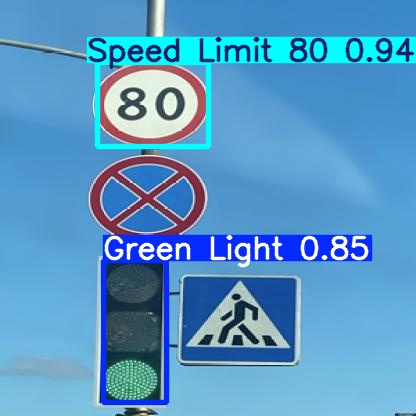

In [ ]:
#showing the result
Image('test.jpg')

In [ ]:
#testing trained model using a video
!python detect.py --source /video.mp4 --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/data/tutrial_tensorflow/yolo/video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 212 layers, 20909508 parameters, 0 gradients, 48.0 GFLOPs
video 1/1 (1/508) /content/drive/MyDrive/data/tutrial_tensorflow/yolo/video.mp4: 640x640 1 Stop, 27.2ms
video 1/1 (2/508) /content/drive/MyDrive/data/tutrial_tensorflow/yolo/video.mp4: 640x640 1 Stop, 27.3ms
video 1/1 (3/508) /content/drive/MyDrive/data/t